In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install -qq transformers

     |████████████████████████████████| 2.3MB 15.8MB/s 
     |████████████████████████████████| 3.3MB 56.2MB/s 
     |████████████████████████████████| 901kB 52.2MB/s 


In [ ]:
import os
import transformers
from transformers import BertModel, BertTokenizer, AdamW, get_linear_schedule_with_warmup
import torch
import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from collections import defaultdict
from textwrap import wrap
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

In [ ]:
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
os.chdir('gdrive/MyDrive/CS772-Assignment4')

In [ ]:
!pwd

/content/gdrive/My Drive/CS772-Assignment4


In [ ]:
df = pd.read_csv("train.csv")
df.drop("Unnamed: 0",axis =1,inplace=True)
df.head()

,reviews,ratings
0,"This book was very informative, covering all a...",4
1,I am already a baseball fan and knew a bit abo...,5
2,I didn't like this product it smudged all unde...,1
3,I simply love the product. I appreciate print ...,5
4,It goes on very easily and makes my eyes look ...,5


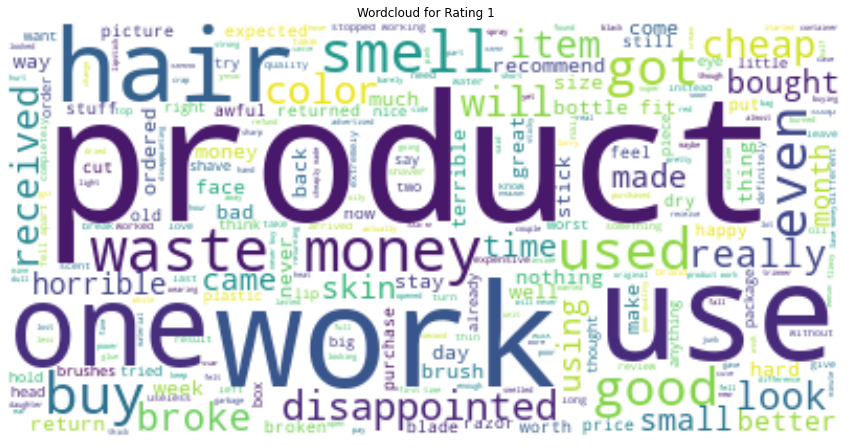

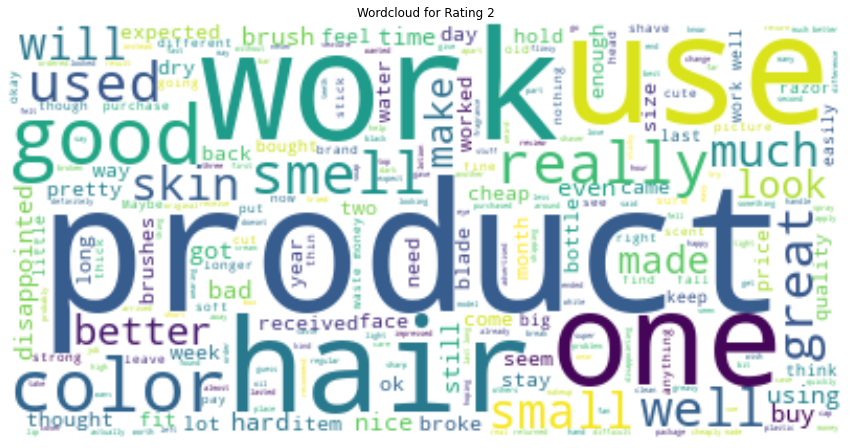

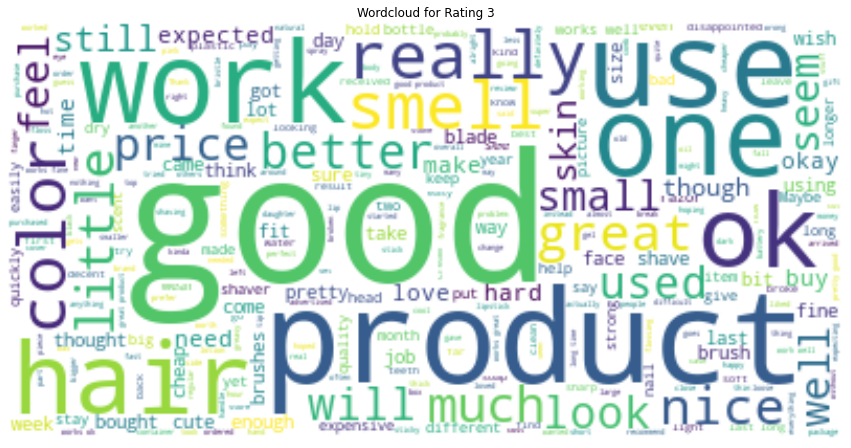

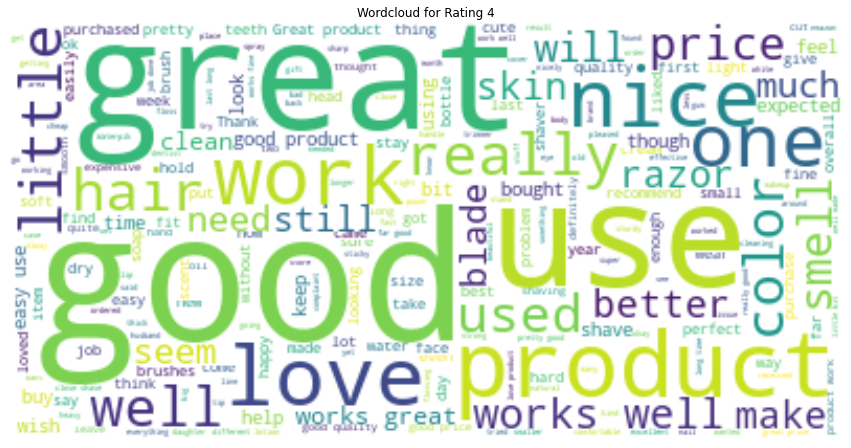

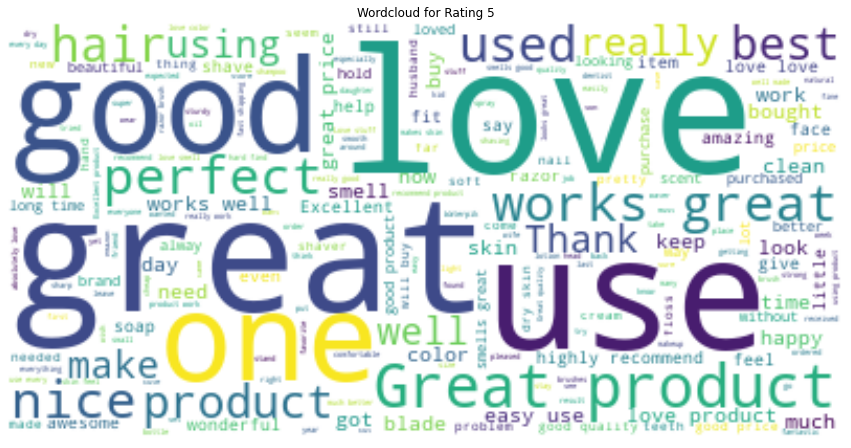

In [ ]:
# Import all necesary libraries
from wordcloud import  WordCloud, STOPWORDS, ImageColorGenerator
 
# Get stopwords from wordcloud library
stopwords = set(STOPWORDS)
for i in range(1,6):
  # join all reviews
  text = " ".join(review for review in df.reviews[df.ratings==i])
  st = ['the','a','and','but','is','they','them','it','this','from','in','as','at','that','wa']
  # Generate the image
  wordcloud = WordCloud(stopwords=stopwords, background_color="white", max_words=500).generate(text)

  # visualize the image
  fig=plt.figure(figsize=(15, 8))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.title('Wordcloud for Rating {}'.format(i))
  plt.show()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[('I', 'nt'), ('nt', 'product'), ('product', 'smudged'), ('smudged', 'eye'), ('eye', 'throughly'), ('throughly', 'day'), ('day', 'Bought'), ('Bought', 'present'), ('present', 'nt'), ('nt', 'fit'), ('fit', 'standard'), ('standard', 'Gillette'), ('Gillette', 'razor'), ('razor', 'Do'), ('Do', 'nt'), ('nt', 'waste'), ('waste', 'money'), ('money', 'po'), ('po', 'The'), ('The', 'stem'), ('stem', 'wo'), ('wo', 'nt'), ('nt', 'screw'), ('screw', 'base'), ('base', 'Very'), ('Very', 'wobbly'), ('wobbly', 'Not'), ('Not', 'Happy'), ('Happy', 'Product'), ('Product', 'arrived'), ('arrived', 'today'), ('today', 'seems'), ('seems', 'poor'), ('poor', 'quality'), ('quality', 'Hope'), ('Hope', 'I'), ('I', 'use'), ('use', 'I'), ('I', 'will'), ('will', 'happier'), ('happier', 'Did'), (

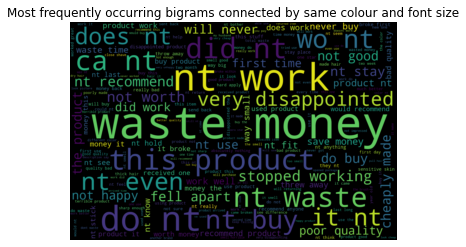

[('The', 'brush'), ('brush', 'side'), ('side', 'small'), ('small', 'brush'), ('brush', 'But'), ('But', 'I'), ('I', 'bent'), ('bent', 'little'), ('little', 'fit'), ('fit', 'fine'), ('fine', 'now'), ('now', 'Does'), ('Does', 'fit'), ('fit', 'brush'), ('brush', 'handle'), ('handle', 'razor'), ('razor', 'slip'), ('slip', 'easily'), ('easily', 'center'), ('center', 'It'), ('It', 's'), ('s', 'nice'), ('nice', 'stand'), ('stand', 'Well'), ('Well', 'built'), ('built', 'good'), ('good', 'foundation'), ('foundation', 'But'), ('But', 'fit'), ('fit', 'Art'), ('Art', 'Shaving'), ('Shaving', 'badger'), ('badger', 'brush'), ('brush', 'Had'), ('Had', 'return'), ('return', 'It'), ('It', 'nt'), ('nt', 'fit'), ('fit', 'harrys'), ('harrys', 'razor'), ('razor', 'Great'), ('Great', 'quality'), ('quality', 'though'), ('though', 'Brush'), ('Brush', 'opening'), ('opening', 'narrow'), ('narrow', 'I'), ('I', 'recommend'), ('recommend', 'finding'), ('finding', 'brush'), ('brush', 'holder'), ('holder', '30mm'), ('

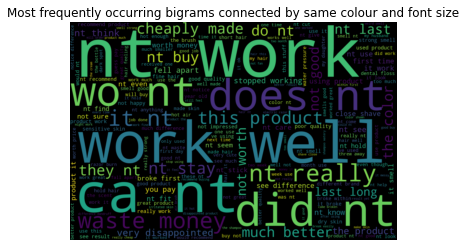

[('Its', 'metal'), ('metal', 'stand'), ('stand', 'It'), ('It', 's'), ('s', 'priced'), ('priced', 'right'), ('right', 'What'), ('What', 'go'), ('go', 'wrong'), ('wrong', 'OK'), ('OK', 'poor'), ('poor', 'quality'), ('quality', 'much'), ('much', 'better'), ('better', 'brand'), ('brand', 'price'), ('price', 'Shiny'), ('Shiny', 'look'), ('look', 'picture'), ('picture', 'Falls'), ('Falls', 'quite'), ('quite', 'frequently'), ('frequently', 'though'), ('though', 'Would'), ('Would', 'better'), ('better', 'held'), ('held', 'badger'), ('badger', 'brush'), ('brush', 'better'), ('better', 'My'), ('My', 'brush'), ('brush', 'fall'), ('fall', 'easily'), ('easily', 'I'), ('I', 's'), ('s', 'made'), ('made', 'China'), ('China', 'Will'), ('Will', 'probably'), ('probably', 'rust'), ('rust', 'It'), ('It', 's'), ('s', 'okay'), ('okay', 'good'), ('good', 'deal'), ('deal', 'price'), ('price', 'pay'), ('pay', 'The'), ('The', 'stand'), ('stand', 'heavy'), ('heavy', 'look'), ('look', 'cheap'), ('cheap', 'Nice'), 

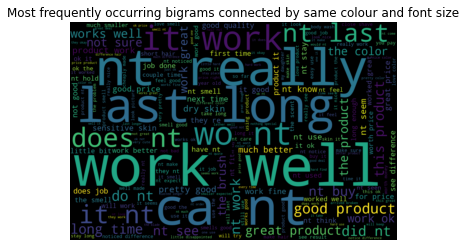

[('This', 'book'), ('book', 'informative'), ('informative', 'covering'), ('covering', 'aspect'), ('aspect', 'game'), ('game', 'Solid'), ('Solid', 'construction'), ('construction', 'good'), ('good', 'fit'), ('fit', 'finish'), ('finish', 'The'), ('The', 'razor'), ('razor', 'side'), ('side', 'fit'), ('fit', 'razor'), ('razor', 'It'), ('It', 'keep'), ('keep', 'razor'), ('razor', 'shaving'), ('shaving', 'brush'), ('brush', 'counter'), ('counter', 'The'), ('The', 'stand'), ('stand', 'weighs'), ('weighs', 'enough'), ('enough', 'nt'), ('nt', 'easily'), ('easily', 'toppled'), ('toppled', 'pushed'), ('pushed', 'around'), ('around', 'I'), ('I', 'may'), ('may', 'put'), ('put', 'larger'), ('larger', 'base'), ('base', 's'), ('s', 'little'), ('little', 'tippy'), ('tippy', 'I'), ('I', 'use'), ('use', 'time'), ('time', 'though'), ('though', 'Very'), ('Very', 'nice'), ('nice', 'razor'), ('razor', 'stand'), ('stand', 'It'), ('It', 'rusting'), ('rusting', 'great'), ('great', 'addition'), ('addition', 'sha

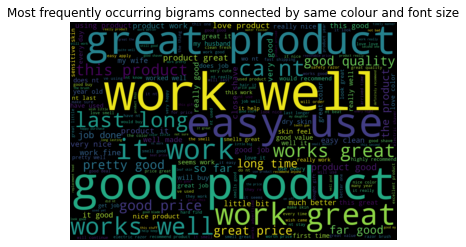

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[('great product', 1301), ('work great', 863), ('love product', 760), ('easy use', 742), ('work well', 664), ('great price', 579), ('ca nt', 573), ('highly recommend', 526), ('works great', 512), ('this product', 474), ('long time', 385), ('love love', 369), ('good product', 356), ('good quality', 345), ('it work', 341), ('good price', 327), ('will buy', 325), ('this great', 315), ('dry skin', 313), ('love stuff', 302), ('love it', 293), ('product it', 292), ('much better', 291), ('product great', 285), ('this stuff', 276), ('smell great', 266), ('excellent product', 259), ('my husband', 258), ('ve used', 257), ('smell good', 251), ('last long', 244), ('recommend product', 243), ('love smell', 242), ('every day', 232), ('very good', 226), ('well made', 225), ('very nice', 223), ('product work', 221), ('works well', 211), ('absolutely love', 210), ('using product', 209), ('skin feel', 208), ('the best', 207), ('this best', 201), ('fast shipping', 200), ('really good', 199), ('really wor

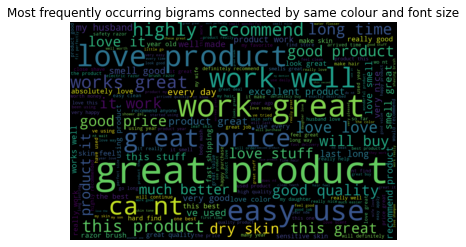

In [ ]:
import nltk
nltk.download('punkt')
nltk.download('wordnet')
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import CountVectorizer
import re
for i in range(1,6):
  WNL = nltk.WordNetLemmatizer()



  text = " ".join(review for review in df.reviews[df.ratings==i])
  tokens = nltk.word_tokenize(text)
  text1 = nltk.Text(tokens)

  # Remove extra chars and remove stop words.
  text_content = [''.join(re.split("[ .,;:!?‘’``''@#$%^_&*()<>{}~\n\t\\\-]", word)) for word in text1]

  #set the stopwords list
  stopwords_wc = set(STOPWORDS)
  customized_words = ['xxx', 'yyy'] # If you want to remove any particular word form text which does not contribute much in meaning

  new_stopwords = stopwords_wc.union(customized_words)
  customised_words = ['xxx', 'yyy'] # If you want to remove any particular word form text which does not contribute much in meaning

  new_stopwords = stopwords_wc.union(customized_words)
  text_content = [word for word in text_content if word not in new_stopwords]

  # After the punctuation above is removed it still leaves empty entries in the list.
  text_content = [s for s in text_content if len(s) != 0]

  # Best to get the lemmas of each word to reduce the number of similar words
  text_content = [WNL.lemmatize(t) for t in text_content]

  nltk_tokens = nltk.word_tokenize(text)  
  bigrams_list = list(nltk.bigrams(text_content))
  print(bigrams_list)
  dictionary2 = [' '.join(tup) for tup in bigrams_list]
  print (dictionary2)

  #Using count vectoriser to view the frequency of bigrams
  vectorizer = CountVectorizer(ngram_range=(2, 2))
  bag_of_words = vectorizer.fit_transform(dictionary2)
  vectorizer.vocabulary_
  sum_words = bag_of_words.sum(axis=0) 
  words_freq = [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
  words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
  print (words_freq[:100])

  #Generating wordcloud and saving as jpg image
  words_dict = dict(words_freq)
  WC_height = 1000
  WC_width = 1500
  WC_max_words = 200
  wordCloud = WordCloud(max_words=WC_max_words, height=WC_height, width=WC_width,stopwords=new_stopwords)
  wordCloud.generate_from_frequencies(words_dict)
  plt.title('Most frequently occurring bigrams connected by same colour and font size')
  plt.imshow(wordCloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


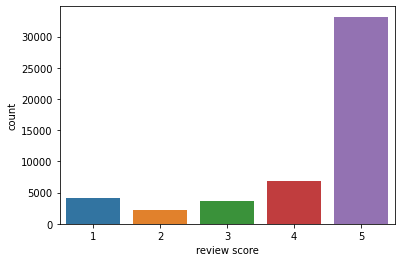

In [ ]:
sns.countplot(df.ratings)
plt.xlabel('review score');

In [ ]:
PRE_TRAINED_MODEL_NAME = 'bert-base-cased'

In [ ]:
tokenizer = BertTokenizer.from_pretrained(PRE_TRAINED_MODEL_NAME)

In [ ]:
token_lens = []
for txt in df.reviews:
  tokens = tokenizer.encode(txt, max_length=512)
  token_lens.append(len(tokens))

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


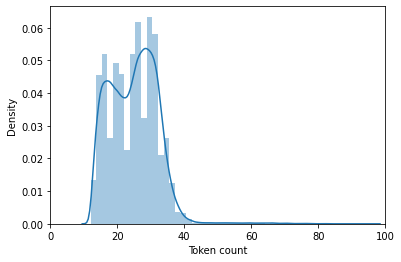

In [ ]:
sns.distplot(token_lens)
plt.xlim([0, 100]);
plt.xlabel('Token count');

In [ ]:
MAX_LEN = 30

In [ ]:
class ReviewDataset(Dataset):
  def __init__(self, reviews, targets, tokenizer, max_len):
    self.reviews = reviews
    self.targets = targets
    self.tokenizer = tokenizer
    self.max_len = max_len
  def __len__(self):
    return len(self.reviews)
  def __getitem__(self, item):
    review = str(self.reviews[item])
    target = self.targets[item]
    encoding = self.tokenizer.encode_plus(
      review,
      add_special_tokens=True,
      max_length=self.max_len,
      return_token_type_ids=False,
      pad_to_max_length=True,
      return_attention_mask=True,
      return_tensors='pt',
    )
    return {
      'review_text': review,
      'input_ids': encoding['input_ids'].flatten(),
      'attention_mask': encoding['attention_mask'].flatten(),
      'targets': torch.tensor(target, dtype=torch.long)
    }

In [ ]:
df_val = pd.read_csv("gold_test.csv")
df_val.drop("Unnamed: 0",axis =1,inplace=True)
df_val.head()

,reviews,ratings
0,Doesn't work at ALL. Don't waste your money or...,1
1,What crap. Would need a lot more power to do ...,1
2,Has no suction and didn't work. Not worth trying.,1
3,That is definitely a trash. Unable to clean an...,1
4,Didn't even worked on cleaning the ears at all...,1


In [ ]:
# df_train, df_test = train_test_split(
#   df,
#   test_size=0.1,
#   random_state=RANDOM_SEED
# )
# df_val, df_test = train_test_split(
#   df_test,
#   test_size=0,
#   random_state=RANDOM_SEED
# )
df_train = df

In [ ]:
df_train.shape, df_val.shape

((50000, 2), (10000, 2))

In [ ]:
def create_data_loader(df, tokenizer, max_len, batch_size):
  ds = ReviewDataset(
    reviews=df.reviews.to_numpy(),
    targets=df.ratings.to_numpy(),
    tokenizer=tokenizer,
    max_len=max_len
  )
  return DataLoader(
    ds,
    batch_size=batch_size,
    num_workers=4
  )

In [ ]:
BATCH_SIZE = 16
train_data_loader = create_data_loader(df_train, tokenizer, MAX_LEN, BATCH_SIZE)
val_data_loader = create_data_loader(df_val, tokenizer, MAX_LEN, BATCH_SIZE)
test_data_loader = create_data_loader(df_val, tokenizer, MAX_LEN, BATCH_SIZE)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
data = next(iter(train_data_loader))
data.keys()

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2079: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a

dict_keys(['review_text', 'input_ids', 'attention_mask', 'targets'])

In [ ]:
print(data['input_ids'].shape)
print(data['input_ids'])
print(data['attention_mask'].shape)
print(data['targets'].shape)

torch.Size([16, 30])
tensor([[  101,  1188,  1520,  1108,  1304, 12862,  5838,   117,  4576,  1155,
          5402,  1104,  1342,   119,   102,     0,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0],
        [  101,   146,  1821,  1640,   170,  3866,  5442,  1105,  1450,   170,
          2113,  1164,  1103, 13898,  8903,   117,  1133,   146,  3560,   170,
          1974,  1167,  3455,  1142,  1520,   119,   102,     0,     0,     0],
        [  101,   146,  1238,   112,   189,  1176,  1142,  3317,  1122,   188,
         13601, 17363,  1155,  1223,  1139,  1257,  1194,  1193,  1103,  1285,
           102,     0,     0,     0,     0,     0,     0,     0,     0,     0],
        [  101,   146,  2566,  1567,  1103,  3317,   119,   146,  8856,  5911,
          4877,  1171,  4423,  1139,  1546,   102,     0,     0,     0,     0,
             0,     0,     0,     0,     0,     0,     0,     0,     0,     0],
        [  101,  1135,  294

In [ ]:
PRE_TRAINED_MODEL_NAME = 'bert-base-cased'

In [ ]:

bert_model = BertModel.from_pretrained(PRE_TRAINED_MODEL_NAME, return_dict=False)

In [ ]:
class SentimentClassifier(nn.Module):
  def __init__(self, n_classes):
    super(SentimentClassifier, self).__init__()
    self.bert = BertModel.from_pretrained(PRE_TRAINED_MODEL_NAME, return_dict=False)
    self.drop = nn.Dropout(p=0.3)
    self.out = nn.Linear(self.bert.config.hidden_size, n_classes)
  def forward(self, input_ids, attention_mask):
    _, pooled_output = self.bert(
      input_ids=input_ids,
      attention_mask=attention_mask
    )
    output = self.drop(pooled_output)
    return self.out(output)

In [ ]:
model = SentimentClassifier(5)
model = model.to(device)


In [ ]:
input_ids = data['input_ids'].to(device)
attention_mask = data['attention_mask'].to(device)
# input_ids = data['input_ids']
# attention_mask = data['attention_mask']
print(input_ids.shape) # batch size x seq length
print(attention_mask.shape) # batch size x seq lengt

torch.Size([16, 30])
torch.Size([16, 30])


In [ ]:
nn.functional.softmax(model(input_ids, attention_mask), dim=1)

tensor([[0.2834, 0.1287, 0.2742, 0.1358, 0.1779],
        [0.3097, 0.0877, 0.2100, 0.1385, 0.2541],
        [0.1737, 0.0902, 0.4319, 0.1146, 0.1897],
        [0.3761, 0.0958, 0.2445, 0.1251, 0.1585],
        [0.3790, 0.1034, 0.1540, 0.1168, 0.2468],
        [0.2147, 0.1103, 0.3463, 0.1152, 0.2135],
        [0.2364, 0.0682, 0.2887, 0.0775, 0.3292],
        [0.1936, 0.1585, 0.2953, 0.1601, 0.1925],
        [0.2386, 0.1150, 0.3958, 0.0976, 0.1530],
        [0.1248, 0.1385, 0.3062, 0.1178, 0.3127],
        [0.2194, 0.0895, 0.2641, 0.1063, 0.3207],
        [0.2578, 0.1392, 0.2920, 0.0749, 0.2361],
        [0.3369, 0.0563, 0.2309, 0.1723, 0.2035],
        [0.2809, 0.0828, 0.2349, 0.1583, 0.2431],
        [0.2490, 0.1147, 0.2881, 0.1841, 0.1641],
        [0.2013, 0.1221, 0.2646, 0.0943, 0.3177]], device='cuda:0',
       grad_fn=<SoftmaxBackward>)

In [ ]:
EPOCHS = 10
optimizer = AdamW(model.parameters(), lr=2e-5, correct_bias=False)
total_steps = len(train_data_loader) * EPOCHS
scheduler = get_linear_schedule_with_warmup(
  optimizer,
  num_warmup_steps=0,
  num_training_steps=total_steps
)
loss_fn = nn.CrossEntropyLoss().to(device)

In [ ]:
def train_epoch(
  model,
  data_loader,
  loss_fn,
  optimizer,
  device,
  scheduler,
  n_examples
):
  model = model.train()
  losses = []
  correct_predictions = 0
  for d in data_loader:
    input_ids = d["input_ids"].to(device)
    attention_mask = d["attention_mask"].to(device)
    targets = d["targets"] - 1 
    targets = targets.to(device)
    # input_ids = d["input_ids"]
    # attention_mask = d["attention_mask"]
    # targets = d["targets"] - 1 
    outputs = model(
      input_ids=input_ids,
      attention_mask=attention_mask
    )
    _, preds = torch.max(outputs, dim=1)
    # print(preds)
    # print(outputs)
    # print(targets)
    loss = loss_fn(outputs, targets)
    correct_predictions += torch.sum(preds == targets)
    losses.append(loss.item())
    loss.backward()
    nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
    optimizer.step()
    scheduler.step()
    optimizer.zero_grad()
  return correct_predictions.double() / n_examples, np.mean(losses)

In [ ]:
def eval_model(model, data_loader, loss_fn, device, n_examples):
  model = model.eval()
  losses = []
  correct_predictions = 0
  with torch.no_grad():
    for d in data_loader:
      input_ids = d["input_ids"].to(device)
      attention_mask = d["attention_mask"].to(device)
      targets = d["targets"] - 1 
      targets = targets.to(device)
    #   input_ids = d["input_ids"]
    #   attention_mask = d["attention_mask"]
    #   targets = d["targets"] - 1 
      outputs = model(
        input_ids=input_ids,
        attention_mask=attention_mask
      )
      _, preds = torch.max(outputs, dim=1)
    #   print(preds)
    #   print(outputs)
    #   print(targets)
      loss = loss_fn(outputs, targets)
      correct_predictions += torch.sum(preds == targets)
      losses.append(loss.item())
  return correct_predictions.double() / n_examples, np.mean(losses)

In [ ]:
%%time
history = defaultdict(list)
best_accuracy = 0
for epoch in range(EPOCHS):
  print(f'Epoch {epoch + 1}/{EPOCHS}')
  print('-' * 10)
  train_acc, train_loss = train_epoch(
    model,
    train_data_loader,
    loss_fn,
    optimizer,
    device,
    scheduler,
    len(df_train)
  )
  print(f'Train loss {train_loss} accuracy {train_acc}')
  val_acc, val_loss = eval_model(
    model,
    val_data_loader,
    loss_fn,
    device,
    len(df_val)
  )
  print(f'Val   loss {val_loss} accuracy {val_acc}')
  print()
  history['train_acc'].append(train_acc)
  history['train_loss'].append(train_loss)
  history['val_acc'].append(val_acc)
  history['val_loss'].append(val_loss)
  if val_acc > best_accuracy:
    torch.save(model.state_dict(), 'best_model_state.bin')
    best_accuracy = val_acc

Epoch 1/10
----------
Train loss 0.7276363842606545 accuracy 0.7387600000000001
Val   loss 0.6738938018441201 accuracy 0.7367

Epoch 2/10
----------
Train loss 0.5636901808515191 accuracy 0.7892800000000001
Val   loss 0.6854588826596737 accuracy 0.7373000000000001

Epoch 3/10
----------
Train loss 0.45344386818349364 accuracy 0.84006
Val   loss 0.7711600216567517 accuracy 0.7322000000000001

Epoch 4/10
----------
Train loss 0.36309925314158203 accuracy 0.87914
Val   loss 0.8679220568269491 accuracy 0.7208

Epoch 5/10
----------
Train loss 0.2909309265013039 accuracy 0.9115800000000001
Val   loss 1.0394281283825635 accuracy 0.7088

Epoch 6/10
----------
Train loss 0.23635126962248235 accuracy 0.93398
Val   loss 1.191345151923597 accuracy 0.7091000000000001

Epoch 7/10
----------
Train loss 0.19633744380539284 accuracy 0.9487800000000001
Val   loss 1.4687808481872082 accuracy 0.6763

Epoch 8/10
----------
Train loss 0.16382138616777026 accuracy 0.9603800000000001
Val   loss 1.62263605004

(0.0, 1.0)

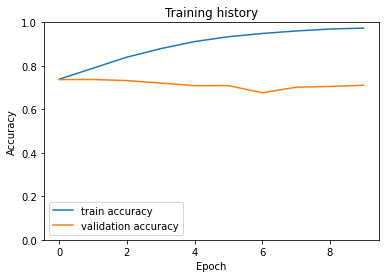

In [ ]:
plt.plot(history['train_acc'], label='train accuracy')
plt.plot(history['val_acc'], label='validation accuracy')
plt.title('Training history')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.ylim([0, 1])

In [ ]:
model.load_state_dict(torch.load('best_model_state.bin'), strict=False)


<All keys matched successfully>

In [ ]:
test_acc, _ = eval_model(
  model,
  val_data_loader,
  loss_fn,
  device,
  len(df_val)
)
test_acc.item()

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:477: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulti

0.7373000000000001

In [ ]:
def get_predictions(model, data_loader):
  model = model.eval()
  review_texts = []
  predictions = []
  prediction_probs = []
  real_values = []
  with torch.no_grad():
    for d in data_loader:
      texts = d["review_text"]
      input_ids = d["input_ids"].to(device)
      attention_mask = d["attention_mask"].to(device)
      targets = d["targets"] - 1 
      targets = d["targets"].to(device)
      outputs = model(
        input_ids=input_ids,
        attention_mask=attention_mask
      )
      _, preds = torch.max(outputs, dim=1)
      review_texts.extend(texts)
      predictions.extend(preds)
      prediction_probs.extend(outputs)
      real_values.extend(targets)
  predictions = torch.stack(predictions).cpu()
  prediction_probs = torch.stack(prediction_probs).cpu()
  real_values = torch.stack(real_values).cpu()
  return review_texts, predictions + 1, prediction_probs, real_values

In [ ]:
y_review_texts, y_pred, y_pred_probs, y_test = get_predictions(
  model,
  val_data_loader
)

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-s

In [ ]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.68      0.80      0.73      1271
           2       0.39      0.13      0.19       630
           3       0.41      0.45      0.43       911
           4       0.45      0.28      0.35      1404
           5       0.85      0.95      0.90      5784

    accuracy                           0.74     10000
   macro avg       0.56      0.52      0.52     10000
weighted avg       0.70      0.74      0.71     10000



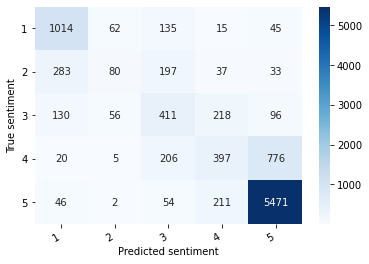

In [ ]:
def show_confusion_matrix(confusion_matrix):
  hmap = sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues")
  hmap.yaxis.set_ticklabels(hmap.yaxis.get_ticklabels(), rotation=0, ha='right')
  hmap.xaxis.set_ticklabels(hmap.xaxis.get_ticklabels(), rotation=30, ha='right')
  plt.ylabel('True sentiment')
  plt.xlabel('Predicted sentiment');
cm = confusion_matrix(y_test, y_pred)
df_cm = pd.DataFrame(cm, index=[str(i) for i in range(1,6)], columns=[str(i) for i in range(1,6)])
show_confusion_matrix(df_cm)

## Testing

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!pip install -qq transformers

     |████████████████████████████████| 2.3MB 4.2MB/s 
     |████████████████████████████████| 3.3MB 36.7MB/s 
     |████████████████████████████████| 901kB 24.1MB/s 


In [ ]:
import os
import transformers
from transformers import BertModel, BertTokenizer, AdamW, get_linear_schedule_with_warmup
import torch
import numpy as np
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from collections import defaultdict
from textwrap import wrap
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline

RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

os.chdir('/content/gdrive/MyDrive/CS772-Assignment4')

In [ ]:
!pip install lime

     |████████████████████████████████| 276kB 4.3MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-cp37-none-any.whl size=283846 sha256=20ec30b3397fb7d166c8985b487dfcaf6584d2728fef6397c7e9e33f1fe70710
  Stored in directory: /root/.cache/pip/wheels/4c/4f/a5/0bc765457bd41378bf3ce8d17d7495369d6e7ca3b712c60c89
Successfully built lime


In [ ]:
class SentimentClassifier(nn.Module):
  def __init__(self, n_classes):
    super(SentimentClassifier, self).__init__()
    self.bert = BertModel.from_pretrained('bert-base-cased', return_dict=False)
    self.drop = nn.Dropout(p=0.3)
    self.out = nn.Linear(self.bert.config.hidden_size, n_classes)
  def forward(self, input_ids, attention_mask):
    _, pooled_output = self.bert(
      input_ids=input_ids,
      attention_mask=attention_mask
    )
    output = self.drop(pooled_output)
    return self.out(output)

In [ ]:
import torch.nn.functional as F
from lime.lime_text import LimeTextExplainer
import torch
torch.cuda.empty_cache()
model1 = SentimentClassifier(5)
model1 = model1.to(device)
model1.load_state_dict(torch.load('best_model_state.bin'), strict=False)
tokenizer1 = BertTokenizer.from_pretrained('bert-base-cased')

class_names = ['1','2', '3','4','5']

Some weights of the model checkpoint at bert-base-cased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
def modelling(text):
      encoded_review = tokenizer1.encode_plus(
      text,
      max_length=30,
      add_special_tokens=True,
      return_token_type_ids=False,
      pad_to_max_length=True,
      return_attention_mask=True,
      return_tensors='pt',truncation=True
      )
      
      input_ids = encoded_review['input_ids'].to(device)
      attention_mask = encoded_review['attention_mask'].to(device)
      output = model1(input_ids, attention_mask)
      output = F.softmax(output)
      

      return output

def predictor(texts):
    ay = []
    print(len(texts))
    for text in texts:
      output = modelling(text)
      ay.extend(output)
      
    predictions = torch.stack(ay).cpu().detach().numpy()
    return predictions

def predict_prob(sent):
    if isinstance(sent,list):
        out = predictor(sent)
        return(out)
    elif isinstance(sent,str):
        out = predictor([sent])
        print('out',out)
        return(out)
    else:
        return("Some ERRORRRR")



In [ ]:
explainer = LimeTextExplainer(class_names=class_names)

str_to_predict = "CS772 is an awesome course"
exp = explainer.explain_instance(str_to_predict, predict_prob,num_features=10,num_samples=500,top_labels=5)

exp.show_in_notebook(text=str_to_predict)

500


In [ ]:
!pip install gradio

     |████████████████████████████████| 1.1MB 9.2MB/s 
     |████████████████████████████████| 215kB 27.1MB/s 
     |████████████████████████████████| 1.9MB 33.4MB/s 
     |████████████████████████████████| 71kB 10.4MB/s 
     |████████████████████████████████| 962kB 58.9MB/s 
     |████████████████████████████████| 3.2MB 56.9MB/s 
  Created wheel for ffmpy: filename=ffmpy-0.3.0-cp37-none-any.whl size=4710 sha256=fb193a69b26d7ed3f6b89ca0c86990131220b338b5292b131624dbcf6f33da56
  Stored in directory: /root/.cache/pip/wheels/cc/ac/c4/bef572cb7e52bfca170046f567e64858632daf77e0f34e5a74
  Created wheel for flask-cachebuster: filename=Flask_CacheBuster-1.0.0-cp37-none-any.whl size=3372 sha256=fabadb413bd8637f15a2c594c8addae3efe2d2a202704c501031557a901f019d
  Stored in directory: /root/.cache/pip/wheels/9f/fc/a7/ab5712c3ace9a8f97276465cc2937316ab8063c1fea488ea77
Successfully built ffmpy flask-cachebuster


In [ ]:
import gradio as gr
def generate_text(inp):
    explainer = LimeTextExplainer(class_names=[str(i) for i in range(1,6)])

    str_to_predict = text
    exp = explainer.explain_instance(str_to_predict, predict_prob,num_features=15,num_samples=500)
    print(exp)
    return exp
#gr.outputs.Textbox()
gr.Interface(generate_text,
             "textbox", 
             gr.outputs.Image()).launch(share=True,debug=True) #, debug=True Use in Colab

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
This share link will expire in 24 hours. If you need a permanent link, visit: https://gradio.app/introducing-hosted (NEW!)
Running on External URL: https://19251.gradio.app
Interface loading below...


[2021-05-10 06:47:26,039] ERROR in app: Exception on /api/predict/ [POST]
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/flask/app.py", line 2447, in wsgi_app
    response = self.full_dispatch_request()
  File "/usr/local/lib/python3.7/dist-packages/flask/app.py", line 1952, in full_dispatch_request
    rv = self.handle_user_exception(e)
  File "/usr/local/lib/python3.7/dist-packages/flask_cors/extension.py", line 165, in wrapped_function
    return cors_after_request(app.make_response(f(*args, **kwargs)))
  File "/usr/local/lib/python3.7/dist-packages/flask/app.py", line 1821, in handle_user_exception
    reraise(exc_type, exc_value, tb)
  File "/usr/local/lib/python3.7/dist-packages/flask/_compat.py", line 39, in reraise
    raise value
  File "/usr/local/lib/python3.7/dist-packages/flask/app.py", line 1950, in full_dispatch_request
    rv = self.dispatch_request()
  File "/usr/local/lib/python3.7/dist-packages/flask/app.py", line 1936, in dispatch_

KeyboardInterrupt: ignored

In [ ]:
import gradio as gr
def generate_text(inp):
    explainer = LimeTextExplainer(class_names=[str(i) for i in range(1,6)])

    str_to_predict = text
    exp = explainer.explain_instance(str_to_predict, predict_prob,num_features=15,num_samples=500)
    print(exp)
    return exp
#gr.outputs.Textbox()
gr.Interface(generate_text,
             "textbox", 
             gr.outputs.Image()).launch(share=True,debug=True) #, debug=True Use in Colab